<h1><font color="#0A4E97"><b><center>Assignment -3 Fraud Analytics</center><br></b></h1></font>

### Aim: 
* Build an Autoencoder model on 2 data sets ECG and Credit Card Fraud. 
* Test various bottleneck dimensions pf autoencoders and do a comparative analysis. 

<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  
<h1><font color="#0A4E97"><b><center> Dataset 1: Credit-Card Fraud Detection </center><br></b></h1></font>

### Datset Overview:

* The dataset contains transactions made by credit cards in September 2013 by European cardholders.
* This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.
* It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from scipy.stats import shapiro
import warnings 
warnings.filterwarnings("ignore")
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from math import ceil, floor
from keras.layers import Input, Dense
from keras.models import Model, Sequential
from keras import regularizers
from sklearn.manifold import TSNE
from sklearn import preprocessing 
from keras.utils import plot_model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [2]:
data = pd.read_csv(r"C:\Users\krtej\Jupyter_folder\Fraud\Dataset\Credit_Card-Fraud-Detection-Dataset\creditcard.csv")

In [3]:
data 

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


<h2><font color="#0A4E97"><b>1. Exploratory Data Analysis <br></b></h2></font>

<h3><font color="#0A4E97"><b>Null Values and Data types <br></b></h3></font>

In [4]:
data.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

<h3><font color="#0A4E97"><b>Descriptive Analytics <br></b></h3></font>

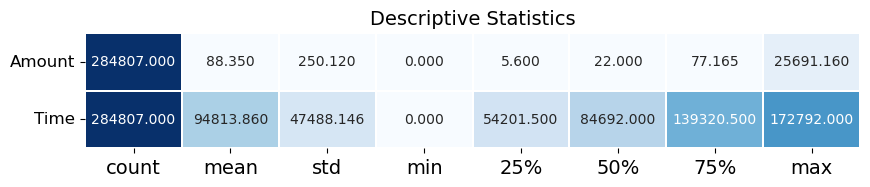

In [6]:
# statistical summary:
cols =data[["Amount","Time"]]
cmap1 = 'Blues'
def desc_stats(dataframe):
    desc = dataframe.describe().T
    f,ax = plt.subplots(figsize=(10,
                                 desc.shape[0] * 0.75))
    sns.heatmap(desc,
                annot = True,
                cmap = cmap1,
                fmt= '.3f',
                ax = ax,
                linecolor = 'white',
                linewidths = 1.3,
                cbar = False,
                annot_kws = {"size": 10})
    plt.xticks(size = 14)
    plt.yticks(size = 12,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 14)
    plt.show()
    
desc_stats(cols)

<h3><font color="#0A4E97"><b>Correlation <br></b></h3></font>

In [7]:
# correlation matrix
corr = data.corr()
corr.style.background_gradient(cmap='GnBu')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.117396,-0.010593,-0.419618,-0.105260,0.173072,-0.063016,0.084714,-0.036949,-0.008660,0.030617,-0.247689,0.124348,-0.065902,-0.098757,-0.183453,0.011903,-0.073297,0.090438,0.028975,-0.050866,0.044736,0.144059,0.051142,-0.016182,-0.233083,-0.041407,-0.005135,-0.009413,-0.010596,-0.012323
V1,0.117396,1.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.227709,-0.101347
V2,-0.010593,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.531409,0.091289
V3,-0.419618,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.210880,-0.192961
V4,-0.105260,-0.000000,-0.000000,0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.098732,0.133447
V5,0.173072,0.000000,0.000000,-0.000000,-0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.386356,-0.094974
V6,-0.063016,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.215981,-0.043643
V7,0.084714,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.397311,-0.187257
V8,-0.036949,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.103079,0.019875
V9,-0.008660,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.044246,-0.097733


<h3><font color="#0A4E97"><b>Class Imbalance <br></b></h3></font>

In [8]:
# Distribution of Fraud and Normal Transactions

px.pie(data, names="Class", title="Distribution of Fraud and Normal Transactions:(Normal:0 | Fraud:1)", color_discrete_sequence=['#1E90FF', '#FF4500'],
       template="plotly_dark", width=800, height=600)

In [9]:
def plot_fraud_and_non_fraud_count_over_time(data):
    # Calculate fraud and non-fraud count over time
    df = data.copy()
    df['Time'] = df['Time'] / 3600
    
    hourly_counts = df.groupby(pd.cut(df['Time'], bins=range(0, int(df['Time'].max())+2), right=False)).agg({
        'Class': ['sum', 'count']
    })
    
    hourly_counts.columns = hourly_counts.columns.droplevel()
    hourly_counts = hourly_counts.rename(columns={'sum': 'Fraud Count', 'count': 'Total Count'})
    
    # Scale down non-fraud count for visualization
    hourly_counts['Non-Fraud Count'] = hourly_counts['Total Count'] - hourly_counts['Fraud Count']
    hourly_counts['Scaled Non-Fraud Count'] = hourly_counts['Non-Fraud Count'] * 0.1
    
    return hourly_counts

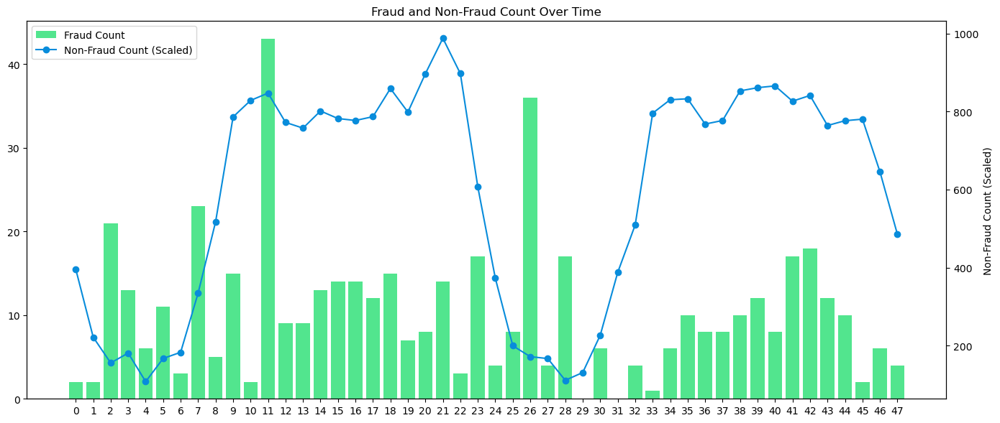

In [10]:
# Calculate fraud and non-fraud counts over time
hourly_counts = plot_fraud_and_non_fraud_count_over_time(data)

# Extract left edges of intervals for x-axis
hourly_hours = [interval.left for interval in hourly_counts.index]

plt.figure(figsize=(14, 6))

# Plot Fraud Count using bars
fraud_bars = plt.bar(hourly_hours, hourly_counts['Fraud Count'], color='#08db5f', alpha=0.7, label='Fraud Count')

# Create a twin Axes sharing the xaxis
ax2 = plt.gca().twinx()

# Plot Scaled Non-Fraud Count using a line
scaled_non_fraud_count = hourly_counts['Scaled Non-Fraud Count']
non_fraud_line, = ax2.plot(hourly_hours, scaled_non_fraud_count, color='#088cdb', marker='o', label='Non-Fraud Count (Scaled)')

plt.title('Fraud and Non-Fraud Count Over Time')
plt.xlabel('Time in Hours')

# Set y-axis labels
plt.ylabel('Fraud Count')
ax2.set_ylabel('Non-Fraud Count (Scaled)')

# Set x-axis ticks for all hours (from 0 to max hour)
max_hour = int(data['Time'].max() / 3600)
plt.xticks(range(max_hour + 1), rotation=45)

# Combine the legends for both axes
plt.legend(handles=[fraud_bars, non_fraud_line], loc='upper left')

plt.tight_layout()
plt.show()

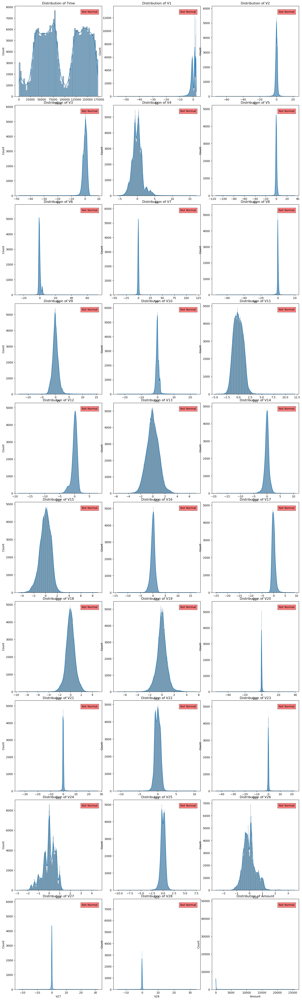

In [11]:
# Create a new DataFrame to store the normality test results
normality_test_results = pd.DataFrame(columns=['Column', 'p-value'])

# Create subplots
num_columns = len(data.columns) - 1  # Exclude the last column
num_rows = int(np.ceil(num_columns / 3))
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
fig.tight_layout()

# Loop through each column and perform Shapiro-Wilk test
for i, column in enumerate(data.columns[:-1]):  # Exclude the last column
    variable = data[column]
    statistic, p_value = shapiro(variable)
    normality_test_results = normality_test_results.append({'Column': column, 'p-value': p_value}, ignore_index=True)
    
    # Create a distribution plot
    ax = axes[i // 3, i % 3]
    sns.histplot(variable, ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    
    # Highlight normal distributions
    if p_value >= 0.05:
        ax.text(0.95, 0.95, 'Normal', transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='green', alpha=0.5))
    else:
        ax.text(0.95, 0.95, 'Not Normal', transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='red', alpha=0.5))

# Remove empty subplots
if num_columns % 3 != 0:
    for i in range(num_columns % 3, 3):
        fig.delaxes(axes[num_rows - 1, i])

# Show the plots
plt.show()

In [12]:
def calculate_roc_scores(data, target_column):
    # Split data into features (X) and target (y)
    X = data.drop(target_column, axis=1)
    y = data[target_column]
    
    # Create an empty dictionary to store ROC scores
    roc_scores = {}
    
    # Iterate over each feature
    for feature in X.columns:
        # Select the current feature as input
        X_feature = X[[feature]]
        
        # Split data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X_feature, y, test_size=0.2, random_state=42)
        
        # Train a logistic regression classifier
        clf = LogisticRegression()
        clf.fit(X_train, y_train)
        
        # Predict probabilities for the test set
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Calculate ROC AUC score
        roc_score = roc_auc_score(y_test, y_pred_prob)
        
        # Store the ROC score in the dictionary
        roc_scores[feature] = roc_score
    
    # Create a DataFrame from the dictionary
    roc_df = pd.DataFrame.from_dict(roc_scores, orient='index', columns=['ROC AUC Score'])
    return roc_df

In [13]:
def plot_roc_curves_subplots(data, target_column):
    # Calculate ROC scores using the calculate_roc_scores function
    roc_scores_df = calculate_roc_scores(data, target_column)
    
    # Determine the number of subplots
    num_features = len(roc_scores_df)
    num_cols = 3
    num_rows = int(np.ceil(num_features / num_cols)) - 1
    
    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    
    # Flatten the axes array if necessary
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    
    # Iterate over each feature and subplot
    for i, (feature, ax) in enumerate(zip(roc_scores_df.index, axes)):
        if i < num_features: 
            X_feature = data[[feature]]
            y = data[target_column]
            X_train, X_test, y_train, y_test = train_test_split(X_feature, y, test_size=0.2, random_state=42)
            clf = LogisticRegression()
            clf.fit(X_train, y_train)
            y_pred_prob = clf.predict_proba(X_test)[:, 1]
            fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
            roc_score = auc(fpr, tpr)
            
            ax.plot(fpr, tpr, label=f'AUC = {roc_score:.2f}')
            ax.plot([0, 1], [0, 1], 'k--')
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f'ROC Curve for {feature}')
            ax.legend(loc='lower right')
    
    # Adjust layout and show the subplots
    plt.tight_layout()
    plt.show()

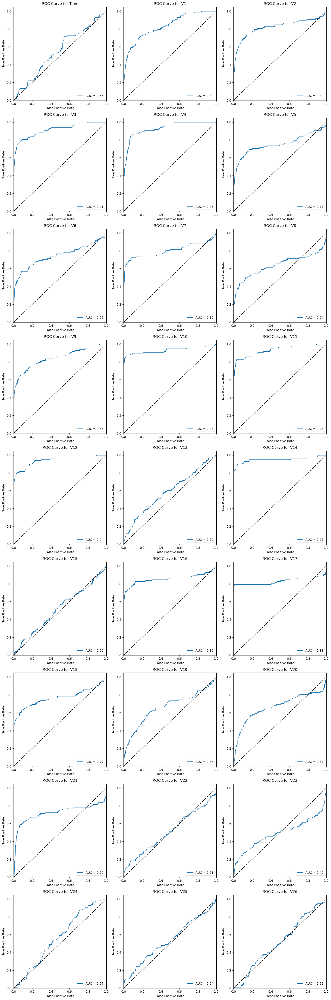

In [14]:
# Call the plot_roc_curves_subplots function to plot ROC curves for each feature
plot_roc_curves_subplots(data, target_column='Class')

In [15]:
non_fraud = data[data['Class'] == 0].sample(10000)
fraud = data[data['Class'] == 1]

df = non_fraud.append(fraud).sample(frac=1).reset_index(drop=True)
X = df.drop(['Class'], axis = 1).values
Y = df["Class"].values

In [16]:
def tsne_plot(x1, y1, name="graph.png"):
    tsne = TSNE(n_components=2, random_state=0)
    X_t = tsne.fit_transform(x1)

    plt.figure(figsize=(12, 8))
    plt.scatter(X_t[y1 == 0, 0], X_t[y1 == 0, 1], marker='o', color='g', linewidth=1, alpha=0.8, label='Non Fraud')
    plt.scatter(X_t[y1 == 1, 0], X_t[y1 == 1, 1], marker='o', color='r', linewidth=1, alpha=0.8, label='Fraud')

    plt.legend(loc='best')
    plt.savefig(name)
    plt.show()

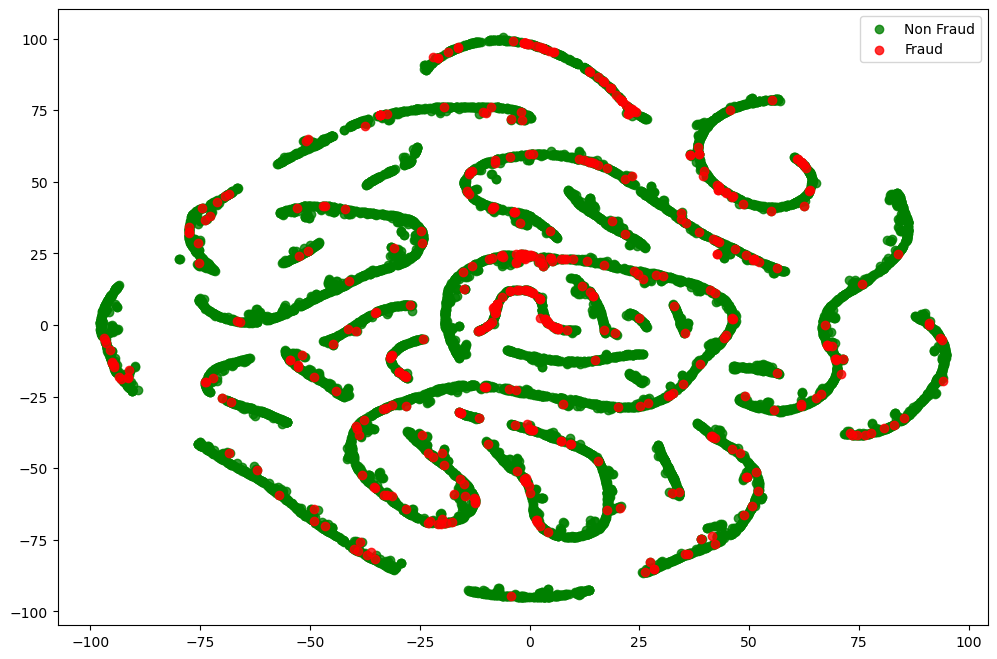

In [17]:
tsne_plot(X, Y, name="graph.png")

* T-SNE (t-Distributed Stochastic Neighbor Embedding) is a dataset decomposition technique which reduced the dimentions of data and produces only top n components with maximum information.

* Every dot in the following represents a transaction. Non Fraud transactions are represented as Green while Fraud transactions are represented as Red. The two axis are the components extracted by tsne.

<h2><font color="#0A4E97"><b>2. Semi Supervised Classification using AutoEncoders <br></b></h2></font>

<h3><font color="#0A4E97"><b>Bottleneck : 50 <br></b></h3></font>

In [18]:

input_layer = Input(shape=(X.shape[1],))
encoded = Dense(100, activation='tanh', activity_regularizer=regularizers.l1(10e-5))(input_layer)
encoded = Dense(50, activation='relu', name='encoded')(encoded)
decoded = Dense(50, activation='tanh')(encoded)
decoded = Dense(100, activation='tanh')(decoded)
output_layer = Dense(X.shape[1], activation='relu')(decoded)

In [19]:
autoencoder = Model(input_layer, output_layer)
autoencoder.compile(optimizer="adadelta", loss="mse")

In [20]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 30)]              0         
                                                                 
 dense (Dense)               (None, 100)               3100      
                                                                 
 encoded (Dense)             (None, 50)                5050      
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 100)               5100      
                                                                 
 dense_3 (Dense)             (None, 30)                3030      
                                                                 
Total params: 18,830
Trainable params: 18,830
Non-trainable p

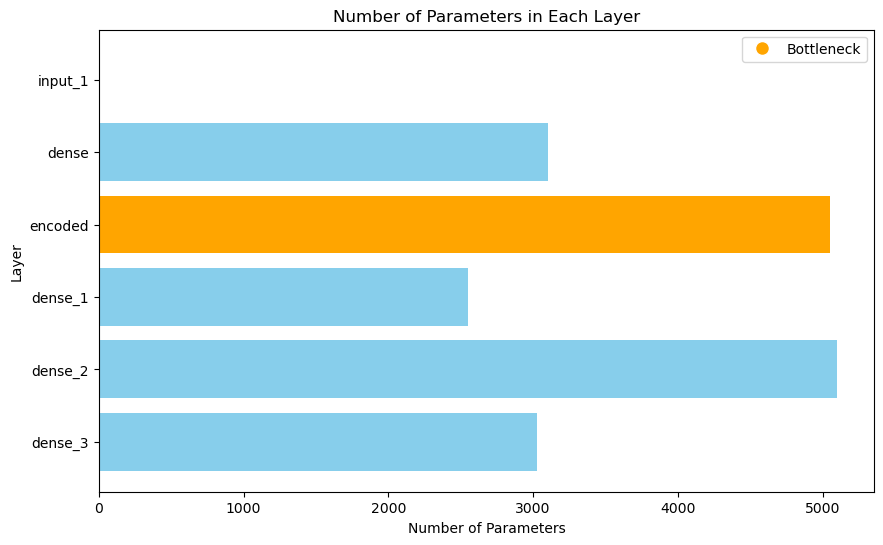

In [21]:
# Get the list of layers in the autoencoder
layers = autoencoder.layers

# Extract layer names, number of parameters, and whether it's a bottleneck layer
layer_names = [layer.name for layer in layers]
num_parameters = [layer.count_params() for layer in layers]
is_bottleneck = ['Bottleneck' if 'encoded' in layer.name else 'Not Bottleneck' for layer in layers]

# Create a bar chart to visualize the number of parameters in each layer
plt.figure(figsize=(10, 6))

# Highlighting color for the bottleneck layer
colors = ['skyblue' if layer != 'Bottleneck' else 'orange' for layer in is_bottleneck]

plt.barh(layer_names, num_parameters, color=colors)
plt.xlabel('Number of Parameters')
plt.ylabel('Layer')
plt.title('Number of Parameters in Each Layer')
plt.gca().invert_yaxis()  # Invert y-axis for better visualization

# Add legend for bottleneck layers
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label='Bottleneck', markerfacecolor='orange', markersize=10)])

plt.show()





##### Performed Min-Max Scaling 

In [22]:
x = data.drop(["Class"], axis=1)
y = data["Class"]

x_scale = preprocessing.MinMaxScaler().fit_transform(x.values)
x_norm, x_fraud = x_scale[y == 0], x_scale[y == 1]

* The beauty of this approach is that we do not need too many samples of data for learning the good representations. We will use only 5000 rows of non fraud cases to train the autoencoder. Additionally, We do not need to run this model for a large number of epochs.

* **Explanation**: The choice of small samples from the original dataset is based on the intuition that one class characteristics (non fraud) will differ from that of the other (fraud). To distinguish these characteristics we need to show the autoencoders only one class of data. This is because the autoencoder will try to learn only one class and automaticlly distinuish the other class.

In [23]:
autoencoder.fit(x_norm[0:5000], x_norm[0:5000], 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
16/16 [==============================] - 1s 13ms/step - loss: 0.2253 - val_loss: 0.2286
Epoch 2/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2245 - val_loss: 0.2278
Epoch 3/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2236 - val_loss: 0.2269
Epoch 4/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2227 - val_loss: 0.2260
Epoch 5/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2217 - val_loss: 0.2250
Epoch 6/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2206 - val_loss: 0.2238
Epoch 7/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2194 - val_loss: 0.2225
Epoch 8/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2181 - val_loss: 0.2212
Epoch 9/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2168 - val_loss: 0.2199
Epoch 10/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2155 - val_loss: 0.2186


#### Obtaining Latent Representations

In [24]:
hidden_representation = Sequential()
hidden_representation.add(autoencoder.layers[0])
hidden_representation.add(autoencoder.layers[1])
hidden_representation.add(autoencoder.layers[2])

In [25]:
norm_hid_rep_BN50 = hidden_representation.predict(x_norm[:3000])
fraud_hid_rep_BN50 = hidden_representation.predict(x_fraud)

16/16 [==============================] - 0s 759us/step


### Visualizing Latent Representation

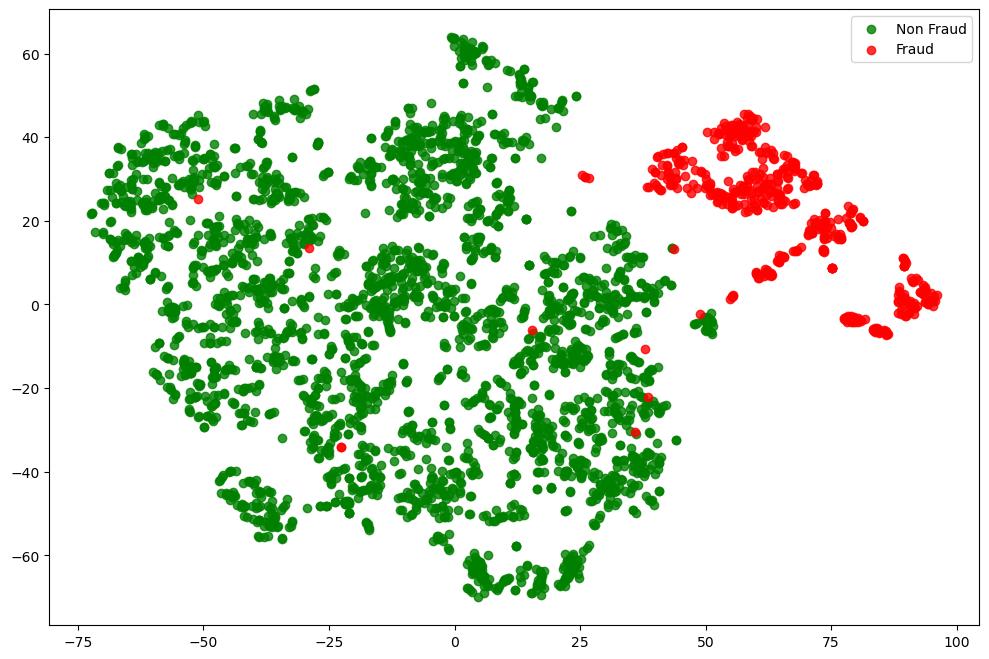

In [26]:
rep_x = np.append(norm_hid_rep_BN50, fraud_hid_rep_BN50, axis = 0)
y_n = np.zeros(norm_hid_rep_BN50.shape[0])
y_f = np.ones(fraud_hid_rep_BN50.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation.png")

<h3><font color="#0A4E97"><b>Bottleneck: 30  <br></b></h3></font>

In [27]:
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(100, activation='tanh', activity_regularizer=regularizers.l1(10e-5))(input_layer)
encoded = Dense(30, activation='relu', name='encoded')(encoded)
decoded = Dense(50, activation='tanh')(encoded)
decoded = Dense(100, activation='tanh')(decoded)
output_layer = Dense(X.shape[1], activation='relu')(decoded)

In [28]:
autoencoder1 = Model(input_layer, output_layer)
autoencoder1.compile(optimizer="adadelta", loss="mse")

In [29]:
autoencoder1.fit(x_norm[0:5000], x_norm[0:5000], 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
16/16 [==============================] - 1s 9ms/step - loss: 0.2159 - val_loss: 0.2182
Epoch 2/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2150 - val_loss: 0.2173
Epoch 3/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2142 - val_loss: 0.2165
Epoch 4/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2134 - val_loss: 0.2156
Epoch 5/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2125 - val_loss: 0.2147
Epoch 6/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2116 - val_loss: 0.2138
Epoch 7/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2108 - val_loss: 0.2129
Epoch 8/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2099 - val_loss: 0.2120
Epoch 9/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2091 - val_loss: 0.2111
Epoch 10/10
16/16 [==============================] - 0s 3ms/step - loss: 0.2082 - val_loss: 0.2102


In [30]:
hidden_representation1 = Sequential()
hidden_representation1.add(autoencoder1.layers[0])
hidden_representation1.add(autoencoder1.layers[1])
hidden_representation1.add(autoencoder1.layers[2])

In [31]:
norm_hid_rep_BN30 = hidden_representation1.predict(x_norm[:3000])
fraud_hid_rep_BN30 = hidden_representation1.predict(x_fraud)

16/16 [==============================] - 0s 668us/step


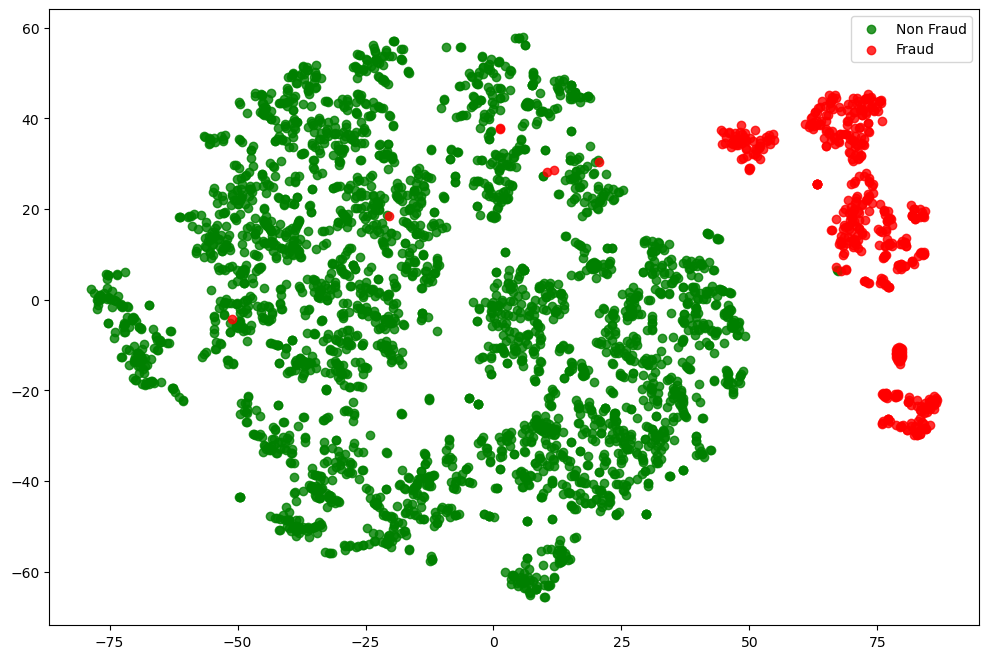

In [32]:
rep_x = np.append(norm_hid_rep_BN30, fraud_hid_rep_BN30, axis = 0)
y_n = np.zeros(norm_hid_rep_BN30.shape[0])
y_f = np.ones(fraud_hid_rep_BN30.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN30).png")

<h3><font color="#0A4E97"><b>Bottleneck: 15  <br></b></h3></font>

In [33]:
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(100, activation='tanh', activity_regularizer=regularizers.l1(10e-5))(input_layer)
encoded = Dense(15, activation='relu', name='encoded')(encoded)
decoded = Dense(50, activation='tanh')(encoded)
decoded = Dense(100, activation='tanh')(decoded)
output_layer = Dense(X.shape[1], activation='relu')(decoded)

In [34]:
autoencoder2 = Model(input_layer, output_layer)
autoencoder2.compile(optimizer="adadelta", loss="mse")

In [35]:
autoencoder2.fit(x_norm[0:5000], x_norm[0:5000], 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
16/16 [==============================] - 1s 11ms/step - loss: 0.2625 - val_loss: 0.2653
Epoch 2/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2617 - val_loss: 0.2646
Epoch 3/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2609 - val_loss: 0.2638
Epoch 4/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2601 - val_loss: 0.2630
Epoch 5/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2593 - val_loss: 0.2622
Epoch 6/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2584 - val_loss: 0.2613
Epoch 7/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2575 - val_loss: 0.2604
Epoch 8/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2565 - val_loss: 0.2595
Epoch 9/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2556 - val_loss: 0.2585
Epoch 10/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2546 - val_loss: 0.2576


In [36]:
hidden_representation2 = Sequential()
hidden_representation2.add(autoencoder2.layers[0])
hidden_representation2.add(autoencoder2.layers[1])
hidden_representation2.add(autoencoder2.layers[2])

In [37]:
norm_hid_rep_BN15 = hidden_representation2.predict(x_norm[:3000])
fraud_hid_rep_BN15 = hidden_representation2.predict(x_fraud)

16/16 [==============================] - 0s 834us/step


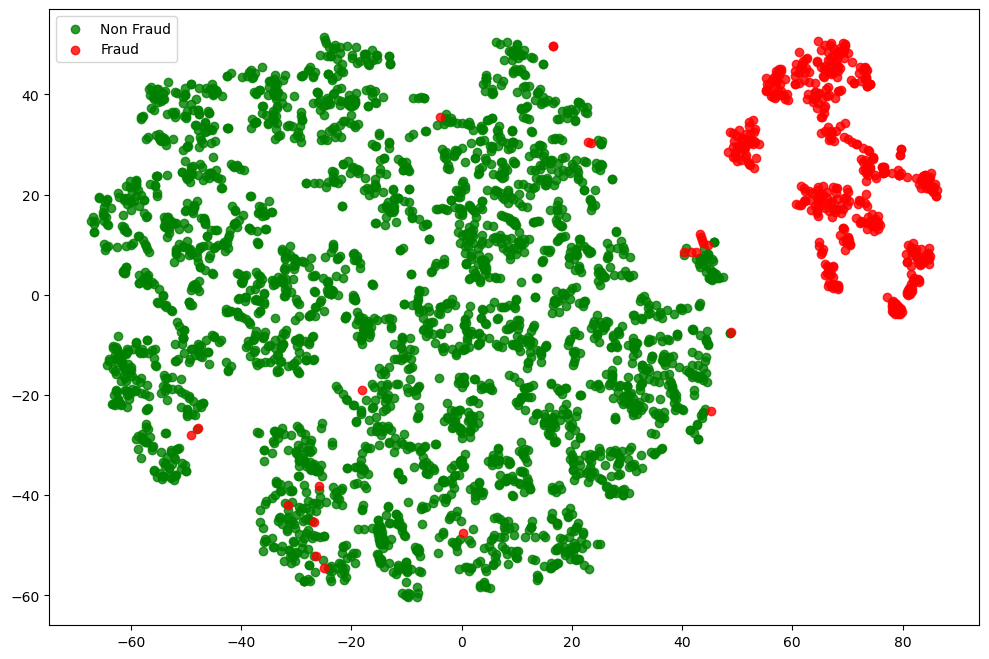

In [38]:
rep_x = np.append(norm_hid_rep_BN15, fraud_hid_rep_BN15, axis = 0)
y_n = np.zeros(norm_hid_rep_BN15.shape[0])
y_f = np.ones(fraud_hid_rep_BN15.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN15).png")

<h3><font color="#0A4E97"><b>Bottleneck: 5  <br></b></h3></font>

In [39]:
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(100, activation='tanh', activity_regularizer=regularizers.l1(10e-5))(input_layer)
encoded = Dense(5, activation='relu', name='encoded')(encoded)
decoded = Dense(50, activation='tanh')(encoded)
decoded = Dense(100, activation='tanh')(decoded)
output_layer = Dense(X.shape[1], activation='relu')(decoded)

In [40]:
autoencoder3 = Model(input_layer, output_layer)
autoencoder3.compile(optimizer="adadelta", loss="mse")

In [41]:
autoencoder3.fit(x_norm[0:5000], x_norm[0:5000], 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
16/16 [==============================] - 1s 11ms/step - loss: 0.2771 - val_loss: 0.2839
Epoch 2/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2767 - val_loss: 0.2835
Epoch 3/10
16/16 [==============================] - 0s 5ms/step - loss: 0.2762 - val_loss: 0.2830
Epoch 4/10
16/16 [==============================] - 0s 5ms/step - loss: 0.2758 - val_loss: 0.2826
Epoch 5/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2753 - val_loss: 0.2821
Epoch 6/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2748 - val_loss: 0.2816
Epoch 7/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2743 - val_loss: 0.2812
Epoch 8/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2738 - val_loss: 0.2807
Epoch 9/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2733 - val_loss: 0.2801
Epoch 10/10
16/16 [==============================] - 0s 4ms/step - loss: 0.2727 - val_loss: 0.2796


In [42]:
hidden_representation3 = Sequential()
hidden_representation3.add(autoencoder3.layers[0])
hidden_representation3.add(autoencoder3.layers[1])
hidden_representation3.add(autoencoder3.layers[2])

In [43]:
norm_hid_rep_BN5 = hidden_representation3.predict(x_norm[:3000])
fraud_hid_rep_BN5 = hidden_representation3.predict(x_fraud)

16/16 [==============================] - 0s 1ms/step


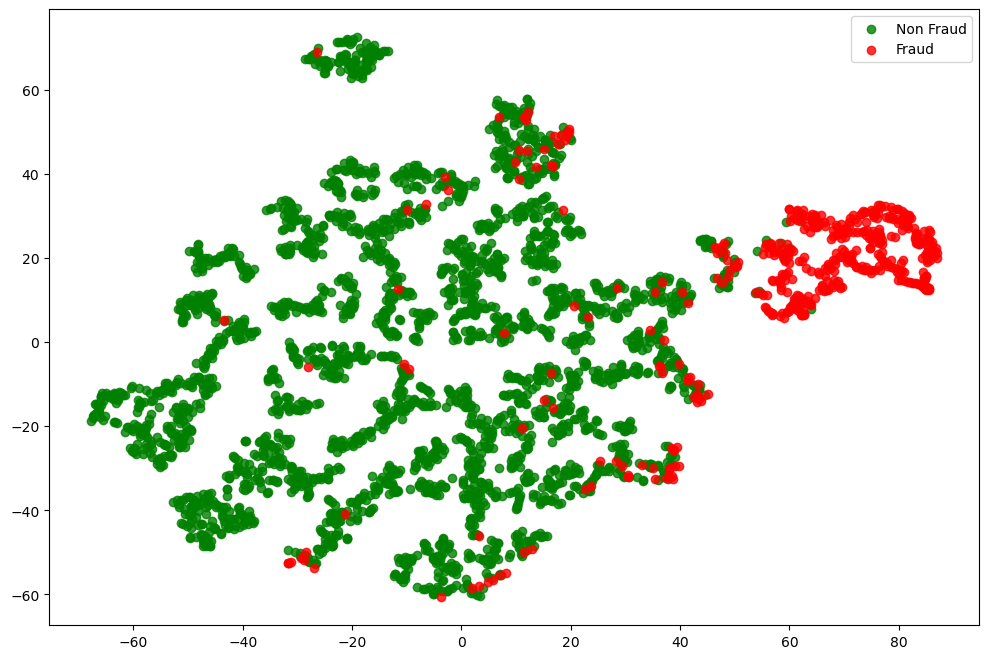

In [44]:
rep_x = np.append(norm_hid_rep_BN5, fraud_hid_rep_BN5, axis = 0)
y_n = np.zeros(norm_hid_rep_BN5.shape[0])
y_f = np.ones(fraud_hid_rep_BN5.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN5).png")

<h2><font color="#0A4E97"><b>3. Testing Recall using Logistic Regression for Bottlenecks (50, 30, 15, 5) <br></b></h2></font>

In [45]:
classifier = LogisticRegression()

In [46]:
rep_x1 = np.append(norm_hid_rep_BN50, fraud_hid_rep_BN50, axis = 0)

In [47]:
train_x, val_x, train_y, val_y = train_test_split(rep_x1, rep_y, test_size=0.25)
clf = LogisticRegression(solver="lbfgs").fit(train_x, train_y)
pred_y = clf.predict(val_x)

print ("")
print ("Classification Report(BN50): ")
print (classification_report(val_y, pred_y))

print ("")
print ("Accuracy Score: ", accuracy_score(val_y, pred_y))


Classification Report(BN50): 
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98       747
         1.0       1.00      0.81      0.89       126

    accuracy                           0.97       873
   macro avg       0.98      0.90      0.94       873
weighted avg       0.97      0.97      0.97       873


Accuracy Score:  0.9725085910652921


In [48]:
rep_x2 = np.append(norm_hid_rep_BN30, fraud_hid_rep_BN30, axis = 0)

In [49]:
train_x, val_x, train_y, val_y = train_test_split(rep_x2, rep_y, test_size=0.25)
clf = LogisticRegression(solver="lbfgs").fit(train_x, train_y)
pred_y = clf.predict(val_x)

print ("")
print ("Classification Report(BN30): ")
print (classification_report(val_y, pred_y))

print ("")
print ("Accuracy Score: ", accuracy_score(val_y, pred_y))


Classification Report(BN30): 
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       747
         1.0       1.00      0.87      0.93       126

    accuracy                           0.98       873
   macro avg       0.99      0.93      0.96       873
weighted avg       0.98      0.98      0.98       873


Accuracy Score:  0.9805269186712485


In [50]:
rep_x3 = np.append(norm_hid_rep_BN15, fraud_hid_rep_BN15, axis = 0)

In [51]:
train_x, val_x, train_y, val_y = train_test_split(rep_x3, rep_y, test_size=0.25)
clf = LogisticRegression(solver="lbfgs").fit(train_x, train_y)
pred_y = clf.predict(val_x)

print ("")
print ("Classification Report(BN15): ")
print (classification_report(val_y, pred_y))

print ("")
print ("Accuracy Score: ", accuracy_score(val_y, pred_y))


Classification Report(BN15): 
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       745
         1.0       1.00      0.74      0.85       128

    accuracy                           0.96       873
   macro avg       0.98      0.87      0.92       873
weighted avg       0.96      0.96      0.96       873


Accuracy Score:  0.9621993127147767


In [52]:
rep_x4 = np.append(norm_hid_rep_BN5, fraud_hid_rep_BN5, axis = 0)

In [53]:
train_x, val_x, train_y, val_y = train_test_split(rep_x4, rep_y, test_size=0.25)
clf = LogisticRegression(solver="lbfgs").fit(train_x, train_y)
pred_y = clf.predict(val_x)

print ("")
print ("Classification Report(BN5): ")
print (classification_report(val_y, pred_y))

print ("")
print ("Accuracy Score: ", accuracy_score(val_y, pred_y))


Classification Report(BN5): 
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96       739
         1.0       0.99      0.51      0.68       134

    accuracy                           0.92       873
   macro avg       0.95      0.76      0.82       873
weighted avg       0.93      0.92      0.91       873


Accuracy Score:  0.9243986254295533


<h2><font color="#0A4E97"><b>4. Conclusion <br></b></h2></font>

In [54]:
from IPython.display import display, Image, HTML
display(HTML("""<table align="center">
<tr ><td><b>Actual Representation (Before) </b></td><td><b>Latent Representation (BN50)</b></td></tr>
<tr><td><img src='graph.png'></td><td>
             <img src='latent_representation.png'></td></tr></table>"""))

Actual Representation (Before),Latent Representation (BN50)
,


* Created 5 models and extracted their latent features to form new dataset which was then used to run LR and test recall, precision across all models. 

#### Result :

* **Recall**: Remained same i.e. 1 across all bottlenecks
* **Precision**: Was highest for BN50 i.e 0.987 was very similar to that of BN30 which was 0.985, thus 30 can be considered most optimal, while others such as BN15 (precision: 0.961) BN5(0.947) also performed well 
<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  

<h1><font color="#0A4E97"><b><center> Dataset 2: ECG Data </center><br></b></h1></font>

<h2><font color="#0A4E97"><b>1. Data Overview <br></b></h2></font>

* This dataset contains 5,000 Electrocardiograms, each with 140 data points. You will use a simplified version of the dataset, where each example has been labeled either 0 (corresponding to an abnormal rhythm), or 1 (corresponding to a normal rhythm). You are interested in identifying the abnormal rhythms.

* Note: This is a labeled dataset, so you could phrase this as a supervised learning problem. The goal of this example is to illustrate anomaly detection concepts you can apply to larger datasets, where you do not have labels available (for example, if you had many thousands of normal rhythms, and only a small number of abnormal rhythms).

* How will you detect anomalies using an autoencoder? Recall that an autoencoder is trained to minimize reconstruction error. You will train an autoencoder on the normal rhythms only, then use it to reconstruct all the data. Our hypothesis is that the abnormal rhythms will have higher reconstruction error. You will then classify a rhythm as an anomaly if the reconstruction error surpasses a fixed threshold.

In [107]:
data = pd.read_csv('http://storage.googleapis.com/download.tensorflow.org/data/ecg.csv', header = None)

In [108]:
data

,0,1,2,3,4,5,6,7,8,9,...,131,132,133,134,135,136,137,138,139,140
0,-0.112522,-2.827204,-3.773897,-4.349751,-4.376041,-3.474986,-2.181408,-1.818286,-1.250522,-0.477492,...,0.792168,0.933541,0.796958,0.578621,0.257740,0.228077,0.123431,0.925286,0.193137,1.0
1,-1.100878,-3.996840,-4.285843,-4.506579,-4.022377,-3.234368,-1.566126,-0.992258,-0.754680,0.042321,...,0.538356,0.656881,0.787490,0.724046,0.555784,0.476333,0.773820,1.119621,-1.436250,1.0
2,-0.567088,-2.593450,-3.874230,-4.584095,-4.187449,-3.151462,-1.742940,-1.490659,-1.183580,-0.394229,...,0.886073,0.531452,0.311377,-0.021919,-0.713683,-0.532197,0.321097,0.904227,-0.421797,1.0
3,0.490473,-1.914407,-3.616364,-4.318823,-4.268016,-3.881110,-2.993280,-1.671131,-1.333884,-0.965629,...,0.350816,0.499111,0.600345,0.842069,0.952074,0.990133,1.086798,1.403011,-0.383564,1.0
4,0.800232,-0.874252,-2.384761,-3.973292,-4.338224,-3.802422,-2.534510,-1.783423,-1.594450,-0.753199,...,1.148884,0.958434,1.059025,1.371682,1.277392,0.960304,0.971020,1.614392,1.421456,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,0.608558,-0.335651,-0.990948,-1.784153,-2.626145,-2.957065,-2.931897,-2.664816,-2.090137,-1.461841,...,1.757705,2.291923,2.704595,2.451519,2.017396,1.704358,1.688542,1.629593,1.342651,0.0
4994,-2.060402,-2.860116,-3.405074,-3.748719,-3.513561,-3.006545,-2.234850,-1.593270,-1.075279,-0.976047,...,1.388947,2.079675,2.433375,2.159484,1.819747,1.534767,1.696818,1.483832,1.047612,0.0
4995,-1.122969,-2.252925,-2.867628,-3.358605,-3.167849,-2.638360,-1.664162,-0.935655,-0.866953,-0.645363,...,-0.472419,-1.310147,-2.029521,-3.221294,-4.176790,-4.009720,-2.874136,-2.008369,-1.808334,0.0
4996,-0.547705,-1.889545,-2.839779,-3.457912,-3.929149,-3.966026,-3.492560,-2.695270,-1.849691,-1.374321,...,1.258419,1.907530,2.280888,1.895242,1.437702,1.193433,1.261335,1.150449,0.804932,0.0


In [109]:
df = data.add_prefix('c')

<h2><font color="#0A4E97"><b>2. EDA <br></b></h2></font>

In [110]:
data.isna().sum()

0      0
1      0
2      0
3      0
4      0
      ..
136    0
137    0
138    0
139    0
140    0
Length: 141, dtype: int64

In [111]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Columns: 141 entries, 0 to 140
dtypes: float64(141)
memory usage: 5.4 MB


In [112]:
px.pie(data, names=140, title="Distribution of Fraud and Normal Transactions:(Normal:0 | Fraud:1)", color_discrete_sequence=['#1E90FF', '#FF4500'],
       template="plotly_dark", width=800, height=600)

In [113]:
train_data, test_data, train_labels, test_labels = train_test_split(df.values, df.values[:,0:1], test_size=0.2, random_state=111)

In [114]:
scaler = MinMaxScaler()
data_scaled = scaler.fit(train_data)

In [115]:
train_data_scaled = data_scaled.transform(train_data)
test_data_scaled = data_scaled.transform(test_data)

In [116]:
train_data

array([[-1.0426494 , -2.1405158 , -2.9048109 , ...,  1.0945801 ,
         1.1977618 ,  0.        ],
       [-1.261477  , -3.558816  , -4.0743471 , ..., -2.4886271 ,
        -4.306003  ,  1.        ],
       [ 0.20928239, -1.1110524 , -2.0692792 , ..., -0.81644729,
         0.39988495,  0.        ],
       ...,
       [ 1.5393344 ,  1.2445626 ,  0.90616933, ..., -2.6423522 ,
        -0.99477927,  0.        ],
       [-1.2911034 , -4.3935643 , -4.5486718 , ...,  0.96841679,
         0.34697987,  1.        ],
       [ 1.3774891 ,  1.2452032 ,  1.2581908 , ...,  0.41770945,
         1.1289613 ,  0.        ]])

In [117]:
normal_train_data= pd.DataFrame(train_data_scaled).add_prefix('c').query('c0 == 0').values[:,1:]
anomaly_train_data = pd.DataFrame(train_data_scaled).add_prefix('c').query('c0 > 0').values[:,1:]

In [118]:
normal_test_data= pd.DataFrame(test_data_scaled).add_prefix('c').query('c0 == 0').values[:,1:]
anomaly_test_data = pd.DataFrame(test_data_scaled).add_prefix('c').query('c0 > 0').values[:,1:]

In [119]:
print(normal_train_data.shape)
print(normal_test_data.shape)

(1, 140)
(0, 140)


Text(0.5, 1.0, 'Normal ECG')

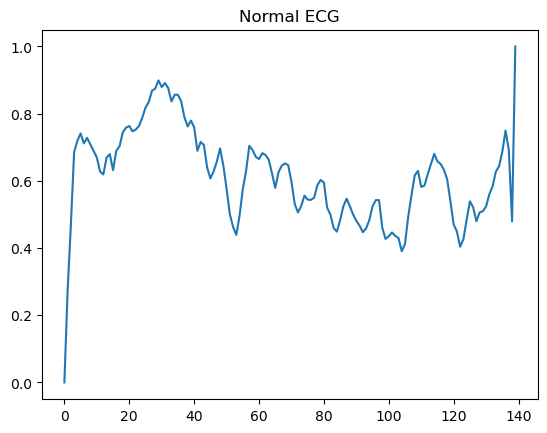

In [120]:
plt.plot(normal_train_data[0])
plt.title('Normal ECG')

Text(0.5, 1.0, 'Abnormal ECG')

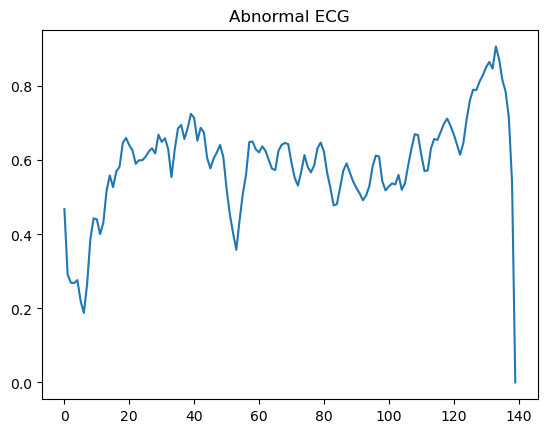

In [121]:
plt.plot(anomaly_train_data[0])
plt.title('Abnormal ECG')

<h2><font color="#0A4E97"><b>2. Semi Supervised Classification using AutoEncoders <br></b></h2></font>

In [122]:
non_fraud = data[data[140] == 0]
fraud = data[data[140] == 1]

df = non_fraud.append(fraud).sample(frac=1).reset_index(drop=True)
X = df.drop([140], axis = 1).values
Y = df[140].values

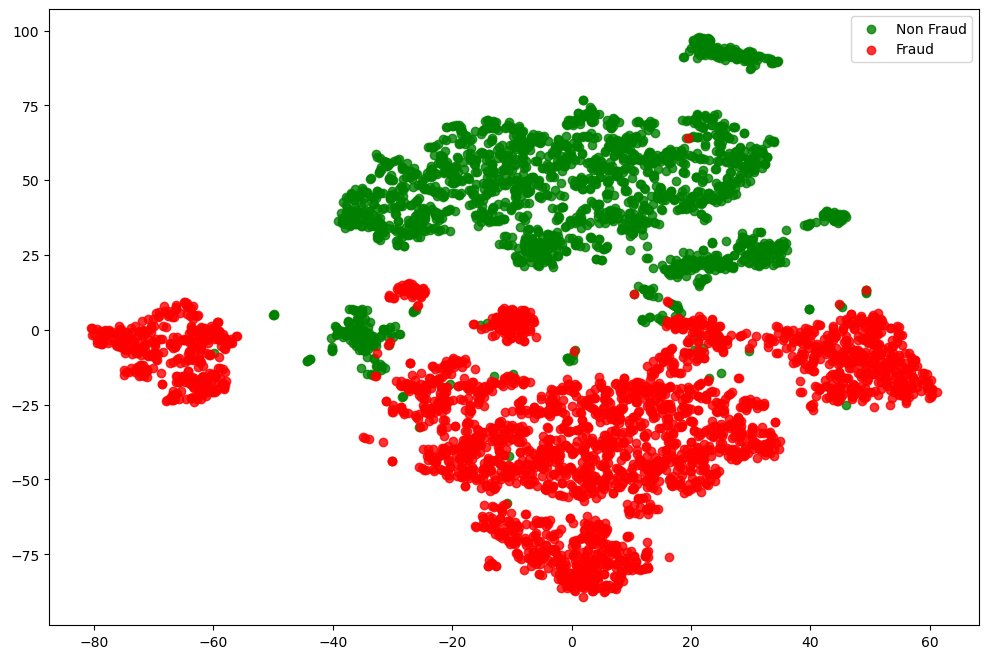

In [123]:
tsne_plot(X, Y, name="graph.png")

In [124]:
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(64, activation='relu')(input_layer)
encoded = Dense(32, activation='relu')(encoded)
encoded = Dense(16, activation='relu')(encoded)
encoded = Dense(8, activation='relu')(encoded)
encoded = Dense(16, activation='relu')(encoded)
encoded = Dense(32, activation='relu')(encoded)
encoded = Dense(64, activation='relu')(encoded)
encoded = Dense(140, activation='sigmoid', name='encoded')(encoded)

decoded = Dense(64, activation='relu')(encoded)
decoded = Dense(32, activation='relu')(decoded)
decoded = Dense(16, activation='relu')(decoded)
decoded = Dense(8, activation='relu')(decoded)
decoded = Dense(16, activation='relu')(decoded)
decoded = Dense(32, activation='relu')(decoded)
decoded = Dense(64, activation='relu')(decoded)
decoded = Dense(X.shape[1], activation='tanh')(decoded)

autoencoder = Model(input_layer, decoded)

In [125]:
class AutoEncoder(Model):
    def __init__(self, bottleneck_size):
        super(AutoEncoder, self).__init__()
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu"),
            tf.keras.layers.Dense(bottleneck_size, activation="relu", name=f"encoded_{bottleneck_size}")])
        
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.Dense(16, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu"),
            tf.keras.layers.Dense(64, activation="relu"),
            tf.keras.layers.Dense(140, activation="sigmoid")])
        
        # Compile the model
        self.compile(optimizer="adadelta", loss="mse")

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def create_and_compile_autoencoder(bottleneck_size):
    autoencoder = AutoEncoder(bottleneck_size=bottleneck_size)
    return autoencoder

In [126]:
# Create and compile instances of the AutoEncoder class
autoencoder_16 = create_and_compile_autoencoder(bottleneck_size=16)
autoencoder_8 = create_and_compile_autoencoder(bottleneck_size=8)
autoencoder_4 = create_and_compile_autoencoder(bottleneck_size=4)

In [127]:
x = data.drop([140], axis=1)
y = data[140]

x_scale = preprocessing.MinMaxScaler().fit_transform(x.values)
x_norm, x_fraud = x_scale[y == 0], x_scale[y == 1]

In [128]:
autoencoder_16.fit(x_norm, x_norm, 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
7/7 [==============================] - 1s 22ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 3/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 5/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 7/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0312 - val_loss: 0.0311
Epoch 10/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0312 - val_loss: 0.0311


In [129]:
autoencoder_8.fit(x_norm, x_norm, 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
7/7 [==============================] - 1s 22ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 3/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 7/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - val_loss: 0.0323
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - val_loss: 0.0323


In [130]:
autoencoder_4.fit(x_norm, x_norm, 
                batch_size = 256, epochs = 10, 
                shuffle = True, validation_split = 0.20);

Epoch 1/10
7/7 [==============================] - 1s 22ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 5/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 7/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.0309 - val_loss: 0.0308
Epoch 10/10
7/7 [==============================] - 0s 6ms/step - loss: 0.0309 - val_loss: 0.0308


<h3><font color="#0A4E97"><b>Bottleneck: 16 <br></b></h3></font>

In [131]:
hidden_representation = Sequential()
hidden_representation.add(autoencoder_16.layers[0])
hidden_representation.add(autoencoder_16.layers[1])

norm_hid_rep_BN16 = hidden_representation.predict(x_norm)
fraud_hid_rep_BN16 = hidden_representation.predict(x_fraud)

92/92 [==============================] - 0s 718us/step


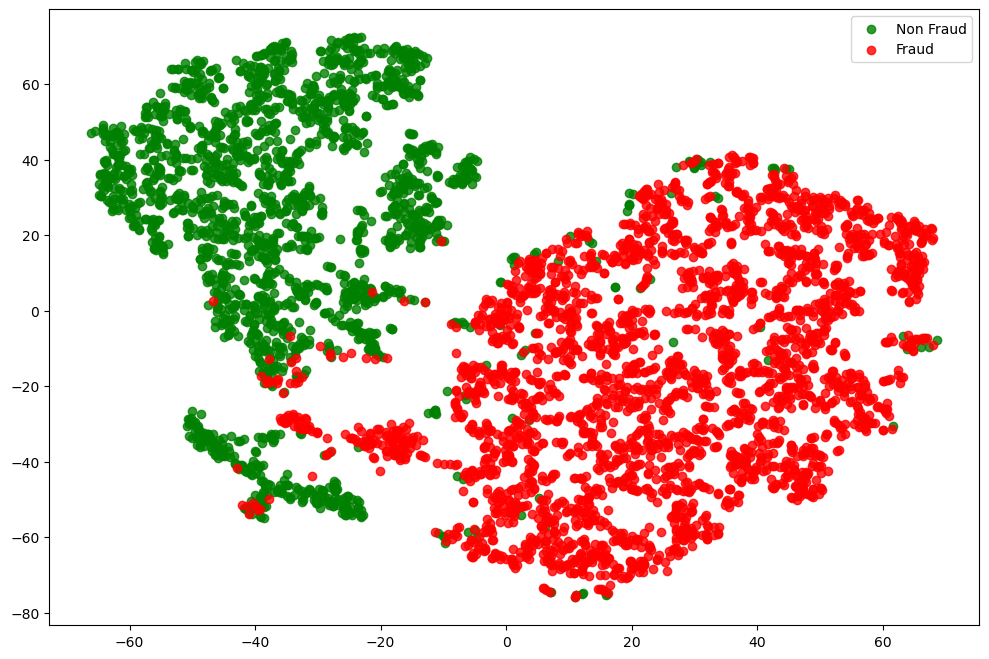

In [132]:
rep_x = np.append(norm_hid_rep_BN16, fraud_hid_rep_BN16, axis = 0)
y_n = np.zeros(norm_hid_rep_BN16.shape[0])
y_f = np.ones(fraud_hid_rep_BN16.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN16).png")

<h3><font color="#0A4E97"><b>Bottleneck: 8  <br></b></h3></font>

In [133]:
hidden_representation_8 = Sequential()
hidden_representation_8.add(autoencoder_8.layers[0])
hidden_representation_8.add(autoencoder_8.layers[1])

norm_hid_rep_BN8 = hidden_representation_8.predict(x_norm)
fraud_hid_rep_BN8 = hidden_representation_8.predict(x_fraud)

92/92 [==============================] - 0s 772us/step


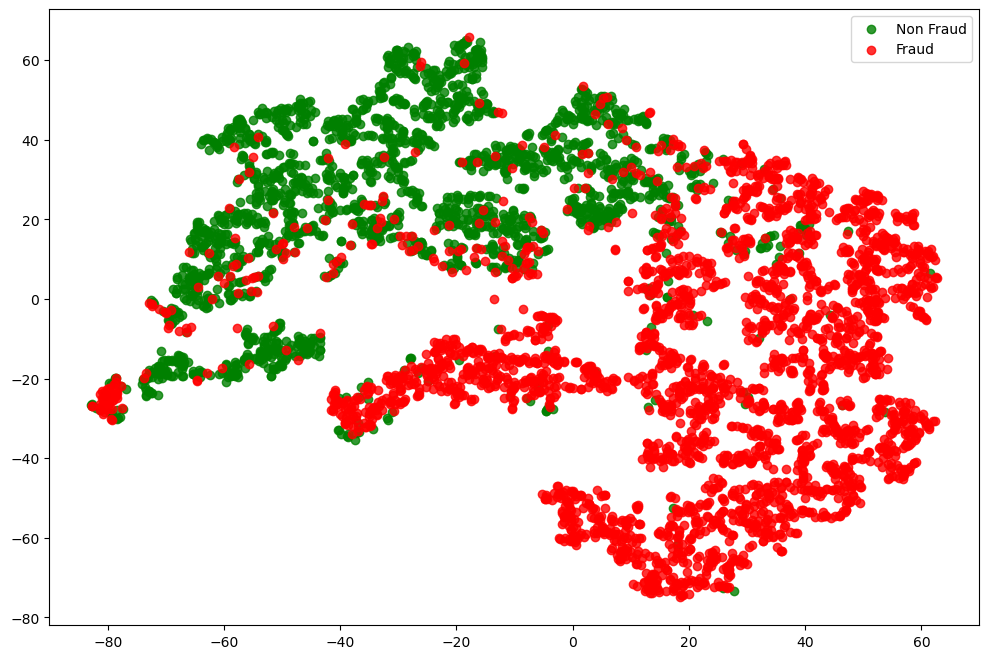

In [134]:
rep_x = np.append(norm_hid_rep_BN8, fraud_hid_rep_BN8, axis = 0)
y_n = np.zeros(norm_hid_rep_BN8.shape[0])
y_f = np.ones(fraud_hid_rep_BN8.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN8).png")

<h3><font color="#0A4E97"><b>Bottleneck: 4  <br></b></h3></font>

In [135]:
hidden_representation_4 = Sequential()
hidden_representation_4.add(autoencoder_4.layers[0])
hidden_representation_4.add(autoencoder_4.layers[1])

norm_hid_rep_BN4 = hidden_representation_4.predict(x_norm)
fraud_hid_rep_BN4 = hidden_representation_4.predict(x_fraud)

92/92 [==============================] - 0s 823us/step


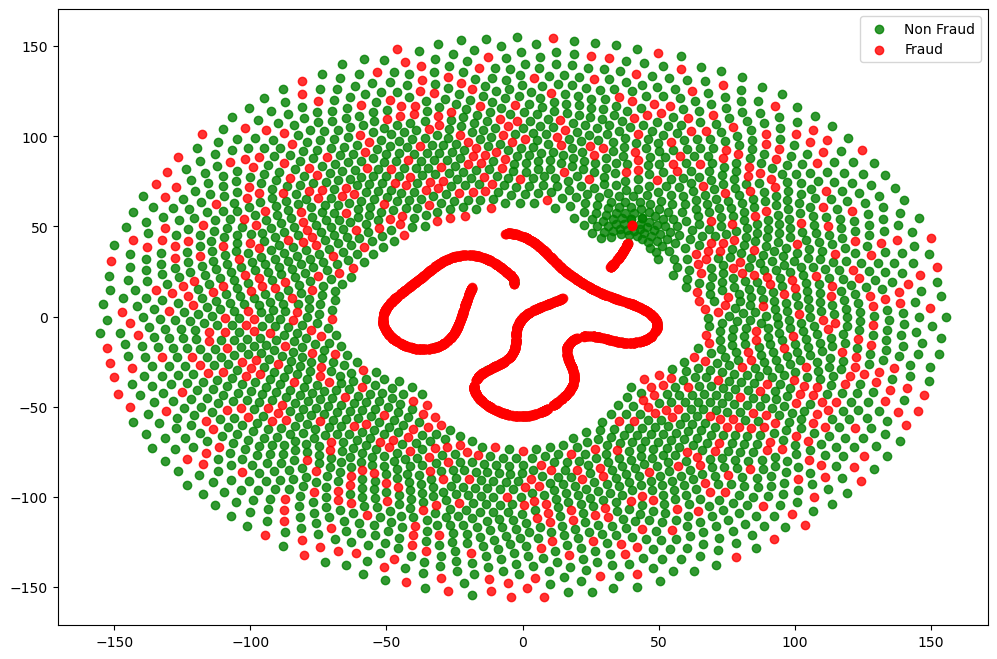

In [136]:
rep_x = np.append(norm_hid_rep_BN4, fraud_hid_rep_BN4, axis = 0)
y_n = np.zeros(norm_hid_rep_BN4.shape[0])
y_f = np.ones(fraud_hid_rep_BN4.shape[0])
rep_y = np.append(y_n, y_f)
tsne_plot(rep_x, rep_y, "latent_representation(BN4).png")

<h2><font color="#0A4E97"><b>3. Testing Recall using Logistic Regression for Bottlenecks (16,8,4) <br></b></h2></font>

In [137]:
rep_x16 = np.append(norm_hid_rep_BN16, fraud_hid_rep_BN16, axis=0)
rep_x8 = np.append(norm_hid_rep_BN8, fraud_hid_rep_BN8, axis=0)
rep_x4 = np.append(norm_hid_rep_BN4, fraud_hid_rep_BN4, axis=0)

In [138]:
# Split data and train logistic regression classifier for rep_x16
train_x16, val_x16, train_y, val_y = train_test_split(rep_x16, rep_y, test_size=0.25)
clf16 = LogisticRegression(solver="lbfgs").fit(train_x16, train_y)
pred_y16 = clf16.predict(val_x16)

print("Classification Report (BN16): ")
print(classification_report(val_y, pred_y16))
print("Accuracy Score (BN16):", accuracy_score(val_y, pred_y16))

# Split data and train logistic regression classifier for rep_x8
train_x8, val_x8, train_y, val_y = train_test_split(rep_x8, rep_y, test_size=0.25)
clf8 = LogisticRegression(solver="lbfgs").fit(train_x8, train_y)
pred_y8 = clf8.predict(val_x8)

print("\nClassification Report (BN8): ")
print(classification_report(val_y, pred_y8))
print("Accuracy Score (BN8):", accuracy_score(val_y, pred_y8))

# Split data and train logistic regression classifier for rep_x4
train_x4, val_x4, train_y, val_y = train_test_split(rep_x4, rep_y, test_size=0.25)
clf4 = LogisticRegression(solver="lbfgs").fit(train_x4, train_y)
pred_y4 = clf4.predict(val_x4)

print("\nClassification Report (BN4): ")
print(classification_report(val_y, pred_y4))
print("Accuracy Score (BN4):", accuracy_score(val_y, pred_y4))

Classification Report (BN16): 
              precision    recall  f1-score   support

         0.0       0.99      0.80      0.89       539
         1.0       0.87      0.99      0.93       711

    accuracy                           0.91      1250
   macro avg       0.93      0.90      0.91      1250
weighted avg       0.92      0.91      0.91      1250

Accuracy Score (BN16): 0.912

Classification Report (BN8): 
              precision    recall  f1-score   support

         0.0       0.83      0.51      0.63       523
         1.0       0.72      0.92      0.81       727

    accuracy                           0.75      1250
   macro avg       0.78      0.72      0.72      1250
weighted avg       0.77      0.75      0.74      1250

Accuracy Score (BN8): 0.7504

Classification Report (BN4): 
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       534
         1.0       0.57      1.00      0.73       716

    accuracy                   

<h2><font color="#0A4E97"><b>4. Conclusion <br></b></h2></font>

In [139]:
from IPython.display import display, Image, HTML
display(HTML("""<table align="center">
<tr ><td><b>Actual Representation (Before) </b></td><td><b>Latent Representation (BN16)</b></td></tr>
<tr><td><img src='graph.png'></td><td>
             <img src='latent_representation(BN16).png'></td></tr></table>"""))

Actual Representation (Before),Latent Representation (BN16)
,


#### Result :

* The BN16 model with a bottleneck size of 16 shows the best performance with a high accuracy, good precision, and recall for both classes.
* The BN8 model with a bottleneck size of 8 has a relatively lower accuracy and struggles to identify normal cases effectively.
* The BN4 model with a bottleneck size of 4 performs the worst, as it fails to correctly identify normal cases.

Overall, the model with a larger bottleneck size (BN16) performs better than the other two in terms of accuracy, precision, and recall, making it a preferable choice for this specific task of fraud detection.

<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  
<h1><font color="#0A4E97"><b><center> Submitted by </center><br></b></h1></font>

### <center> Group 8</center>

##### <center> Ajay K. (22030242007) </center>
##### <center> Yatin Deshpande (22030242015) </center>
##### <center> Geetansh Gupta (22030242018) </center>
##### <center> Adarsh Pawshe (22030242038) </center>
##### <center> Tejas Kumar (22030242055) </center>